#Predicting Bitcoin Price

##Forecasting

Use the exported data from 'Data Collection and Exploration' notebook to forecast the direction of the price of bitcoin.

###Imports

In [3]:
import pandas as pd
from pandas.io.data import DataReader

import numpy as np
from datetime import datetime

import sklearn
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.lda import LDA
from sklearn.qda import QDA
from sklearn.cross_validation import train_test_split
import statsmodels.formula.api as smf
import seaborn as sns

import matplotlib.pyplot as plt
%matplotlib inline


###Creating Lagged Series

Create a pandas DataFrame that contains the lagged percentage returns for a prior number of days (based on the approach described in [Forecasting Financial Time Series](https://www.quantstart.com/articles/Forecasting-Financial-Time-Series-Part-1)).

Define a method to read in the collated bitcoin dataset and select the most recent 2 years:

In [4]:
def get_data(filename, index):
    data = pd.read_csv(filename, index_col=index)
    data = data[(data.date >= '2012-01-01') & (data.date <= '2015-12-31')]

    return data

Define methods create a series of lagged data and percentage returns corresponding to how much the price went up or down compared to the present daily price:

In [5]:
def create_lagged_df(data, lags):
    datalag = pd.DataFrame(index=data.index)
    datalag["price_usd"] = data["price_usd"]
    datalag["percent_cost"] = data["percent_cost"].shift(-1)
    datalag["exchange_vol_usd"] = data["exchange_vol_usd"].shift(-1)
    datalag["market_cap"] = data["market_cap"].shift(-1)
    datalag["deficit"] = data["deficit"].shift(-1)
    datalag["miners_revenue"] = data["miners_revenue"].shift(-1)
    datalag["transaction_fees_usd"] = data["transaction_fees_usd"].shift(-1)
    
    # Create the shifted lag series of prior trading period price values
    for i in xrange(0,lags):
        datalag["lag%s" % str(i+1)] = data["price_usd"].shift(i+1)
   
    return datalag


def create_returns_df(datalag):
    returns = pd.DataFrame(index=datalag.index)
    returns["price_usd"] = datalag["price_usd"].pct_change()*100.0
    
    return returns

In [6]:
def create_lagged_series(lags=30):
    data = get_data('bitcoin_price.csv', 'trading_day')
    
    datalag = create_lagged_df(data, lags)

    returns = create_returns_df(datalag)

    # If any of the values of percentage returns equal zero, set them to
    # a small number (stops issues with QDA model in scikit-learn)
    for i,x in enumerate(returns["price_usd"]):
        if (abs(x) < 0.0001):
            returns["price_usd"][i] = 0.0001

    # Create the lagged percentage returns columns
    for i in xrange(0,lags):
        returns["lag%s" % str(i+1)] = datalag["lag%s" % str(i+1)].pct_change()*100.0
        
    # Create the lagged percentage returns columns
    for i in xrange(0,lags):
        returns["lag%s" % str(i+1)] = datalag["lag%s" % str(i+1)].pct_change()*100.0
        
    # Create the moving average columns commonly used to smooth out short-term 
    # fluctuations and highlight longer-term trends in financial time-series analysis
    returns['ma_3'] = pd.rolling_mean(returns['price_usd'].shift(-1), 3)
    returns['ma_7'] = pd.rolling_mean(returns['price_usd'].shift(-1), 7)
    returns['ma_14'] = pd.rolling_mean(returns['price_usd'].shift(-1), 7)
    
    # Create the moving standard deviation
    returns['msd_3'] = pd.rolling_std(returns['price_usd'].shift(-1), 3)
    returns['msd_7'] = pd.rolling_std(returns['price_usd'].shift(-1), 7)
    
    returns["percent_cost"] = datalag["percent_cost"]
    returns["exchange_vol_usd_log"] = np.log10(datalag["exchange_vol_usd"]) 
    returns["market_cap_log"] = np.log10(datalag["market_cap"])
    returns["deficit"] = datalag["deficit"]
    returns["miners_revenue"] = datalag["miners_revenue"]
    returns["transaction_fees_usd"] = datalag["transaction_fees_usd"]
    
    returns["percent_cost_chg"] = datalag["percent_cost"].pct_change()*100.0
    returns["exchange_vol_usd_chg"] = datalag["exchange_vol_usd"].pct_change()*100.0
    returns["market_cap_chg"] = datalag["market_cap"].pct_change()*100.0
    returns["deficit_chg"] = datalag["deficit"].pct_change()*100.0
    returns["miners_revenue_chg"] = datalag["miners_revenue"].pct_change()*100.0
    returns["transaction_fees_usd_chg"] = np.log10(datalag["transaction_fees_usd"].pct_change()*100.0)    
    
    
    # Create the "Direction" column (+1 or -1) indicating an up/down day
    returns["direction"] = np.sign(returns["price_usd"])

    return returns

Define a method to fit the model on the training set, predict on the test data whether the price of bitcoin will increase or decrease from the prior day's price, then calculate the hit rate:

In [7]:
def fit_model(name, model, X_train, y_train, X_test, pred):
    # Fit and predict the model on the training, and then test, data
    fitted_model = model.fit(X_train, y_train)
    pred[name] = model.predict(X_test)

    # Create a series with 1 being correct direction, 0 being wrong
    # and then calculate the hit rate based on the actual direction
    pred["%s_Correct" % name] = (1.0 + pred[name] * pred["Actual"])/2.0
    hit_rate = np.mean(pred["%s_Correct" % name])
    print "%s: %.3f" % (name, hit_rate)
    
    # Same as score
    #print 'Score: ', model.score(X_test, pred['Actual'])

    #print fitted_model, "\n"

Create the lagged series and exclude NAs:

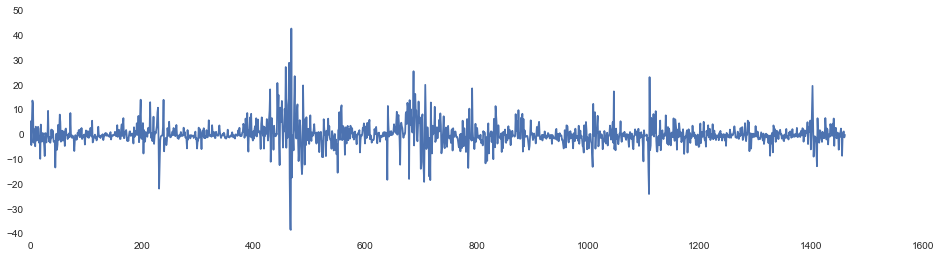

In [8]:
btc = create_lagged_series(lags=14)
plt.figure(figsize=(16,4))
plt.plot(btc['price_usd'])
btc = btc.dropna()

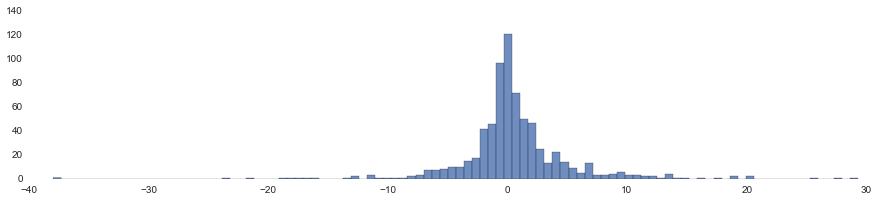

In [9]:
fig = plt.figure(figsize=(15,3))
ax = fig.add_subplot(111)

numBins = 100
ax.hist(btc['price_usd'],numBins,alpha=0.8)
plt.show()


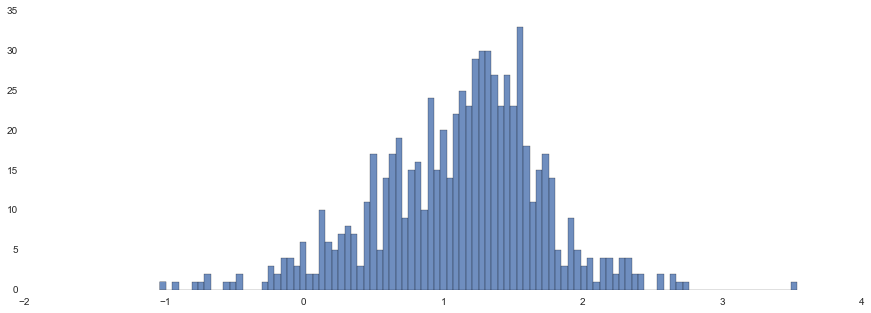

In [10]:
fig = plt.figure(figsize=(15,5))
ax = fig.add_subplot(111)

numBins = 100
ax.hist(btc['transaction_fees_usd_chg'],numBins,alpha=0.8)
plt.show()

In [11]:
print btc.corr()['direction'].sort_values()

percent_cost               -0.152846
lag2                       -0.043827
percent_cost_chg           -0.043708
exchange_vol_usd_chg       -0.042785
deficit_chg                -0.031794
miners_revenue_chg         -0.025995
lag7                       -0.022602
lag4                       -0.021614
lag12                      -0.017834
lag9                       -0.015076
miners_revenue             -0.010170
deficit                     0.011247
transaction_fees_usd_chg    0.012992
msd_3                       0.016105
lag5                        0.016816
lag8                        0.018323
lag13                       0.030125
lag1                        0.030708
market_cap_log              0.032080
lag10                       0.038617
msd_7                       0.043234
lag3                        0.045779
lag11                       0.058615
lag14                       0.068028
lag6                        0.073740
exchange_vol_usd_log        0.091757
transaction_fees_usd        0.096426
m

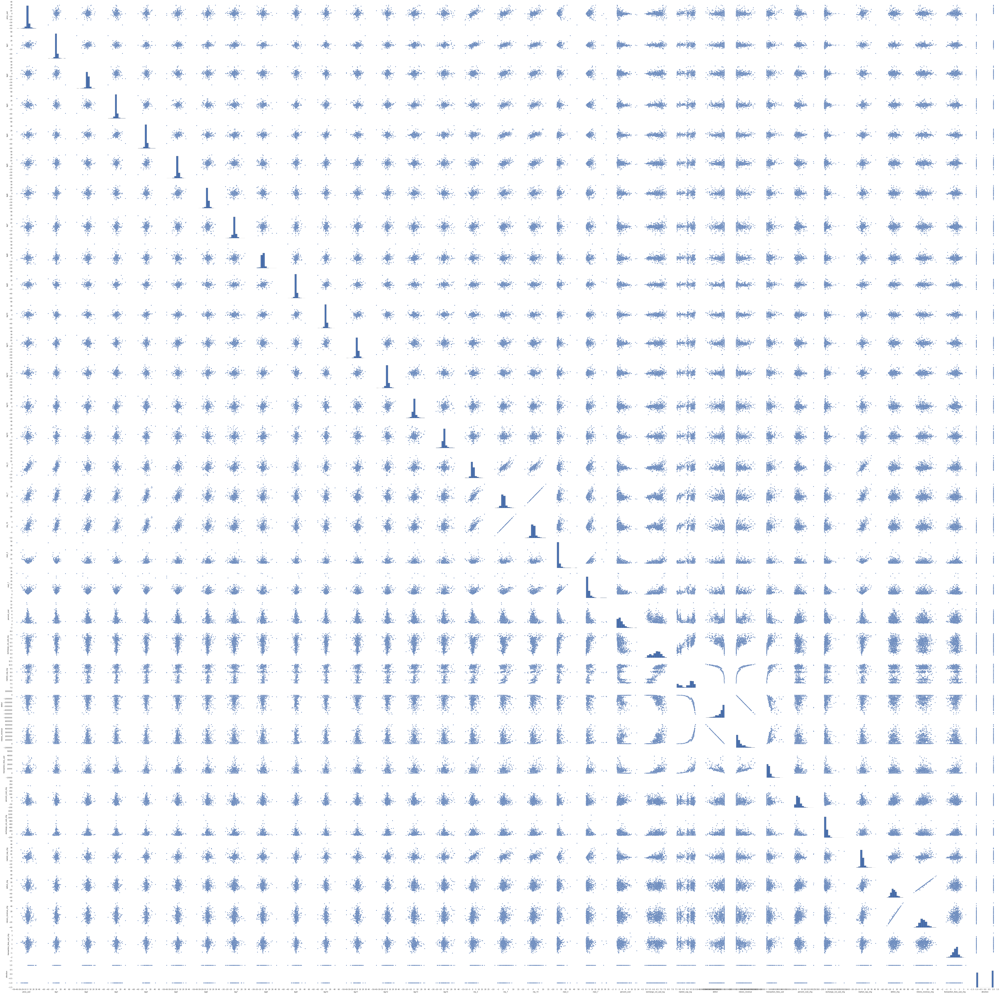

In [636]:
g = sns.pairplot(btc)

In [115]:
def calc_hit_rates(predictors):
    X = btc[predictors]
    y = btc["direction"]
    start_test = '2015-10-01'

    # Create training and test sets
    X_train = X[X.index < start_test]
    X_test = X[X.index >= start_test]
    y_train = y[y.index < start_test]
    y_test = y[y.index >= start_test]

    # Create the prediction DataFrame:
    pred = pd.DataFrame(index=y_test.index)
    pred["Actual"] = y_test

    # Create and fit three basic models:
    print "Hit Rates using the predictors", predictors
    models = [("LR", LogisticRegression()), ("LDA", LDA()), ("QDA", QDA())]
    for m in models:
        fit_model(m[0], m[1], X_train, y_train, X_test, pred)
        
    print "Train / Test data: ", y_train.shape, y_test.shape

In [116]:
predictors = ["ma_3"]
calc_hit_rates(predictors)

Hit Rates using the predictors ['ma_3']
LR: 0.682
LDA: 0.682
QDA: 0.591
Train / Test data:  (671,) (44,)


In [117]:
predictors = ["ma_3", "transaction_fees_usd"]
calc_hit_rates(predictors)

Hit Rates using the predictors ['ma_3', 'transaction_fees_usd']
LR: 0.659
LDA: 0.705
QDA: 0.591
Train / Test data:  (671,) (44,)


In [118]:
predictors = ["ma_3", "market_cap_chg", "transaction_fees_usd", "exchange_vol_usd_chg"]
calc_hit_rates(predictors)

Hit Rates using the predictors ['ma_3', 'market_cap_chg', 'transaction_fees_usd', 'exchange_vol_usd_chg']
LR: 0.636
LDA: 0.568
QDA: 0.614
Train / Test data:  (671,) (44,)


In [119]:
predictors = ["ma_3", "lag6"]
calc_hit_rates(predictors)

Hit Rates using the predictors ['ma_3', 'lag6']
LR: 0.659
LDA: 0.705
QDA: 0.545
Train / Test data:  (671,) (44,)


In [120]:
predictors = ["ma_3", "lag1"]
calc_hit_rates(predictors)

Hit Rates using the predictors ['ma_3', 'lag1']
LR: 0.841
LDA: 0.864
QDA: 0.773
Train / Test data:  (671,) (44,)


In [121]:
predictors = ["ma_3", "lag1", "transaction_fees_usd"]
calc_hit_rates(predictors)

Hit Rates using the predictors ['ma_3', 'lag1', 'transaction_fees_usd']
LR: 0.818
LDA: 0.864
QDA: 0.705
Train / Test data:  (671,) (44,)


In [122]:
predictors = ["ma_3", "lag1", "exchange_vol_usd_log"]
calc_hit_rates(predictors)

Hit Rates using the predictors ['ma_3', 'lag1', 'exchange_vol_usd_log']
LR: 0.864
LDA: 0.841
QDA: 0.795
Train / Test data:  (671,) (44,)


In [123]:
predictors = ["ma_3", "lag1", "market_cap_chg"]
calc_hit_rates(predictors)

Hit Rates using the predictors ['ma_3', 'lag1', 'market_cap_chg']
LR: 1.000
LDA: 0.909
QDA: 0.909
Train / Test data:  (671,) (44,)


In [124]:
predictors = ["ma_3", "lag1", "market_cap_chg", "lag14"]
calc_hit_rates(predictors)

Hit Rates using the predictors ['ma_3', 'lag1', 'market_cap_chg', 'lag14']
LR: 1.000
LDA: 0.932
QDA: 0.886
Train / Test data:  (671,) (44,)


In [132]:
def calc_hit_rates_semi(predictors):
    X = btc[predictors]
    y = btc["direction"]
    start_test = '2015-07-01'

    X_train = X[X.index < start_test]
    X_test = X[X.index >= start_test]
    y_train = y[y.index < start_test]
    y_test = y[y.index >= start_test]

    pred = pd.DataFrame(index=y_test.index)
    pred["Actual"] = y_test

    print "Hit Rates using the predictors", predictors
    models = [("LR", LogisticRegression()), ("LDA", LDA()), ("QDA", QDA())]
    for m in models:
        fit_model(m[0], m[1], X_train, y_train, X_test, pred)
    
    print "Train / Test data: ", y_train.shape, y_test.shape

In [133]:
predictors = ["ma_3", "lag1", "market_cap_chg", "lag14"]
calc_hit_rates_semi(predictors)

Hit Rates using the predictors ['ma_3', 'lag1', 'market_cap_chg', 'lag14']
LR: 0.977
LDA: 0.872
QDA: 0.849
Train / Test data:  (629,) (86,)


In [138]:
predictors = ["ma_3", "lag1", "market_cap_chg"]
calc_hit_rates_semi(predictors)

Hit Rates using the predictors ['ma_3', 'lag1', 'market_cap_chg']
LR: 0.977
LDA: 0.872
QDA: 0.884
Train / Test data:  (629,) (86,)


In [139]:
def calc_hit_rates_annual(predictors):
    X = btc[predictors]
    y = btc["direction"]
    start_test = '2015-01-01'

    X_train = X[X.index < start_test]
    X_test = X[X.index >= start_test]
    y_train = y[y.index < start_test]
    y_test = y[y.index >= start_test]

    pred = pd.DataFrame(index=y_test.index)
    pred["Actual"] = y_test

    print "Hit Rates using the predictors", predictors
    models = [("LR", LogisticRegression()), ("LDA", LDA()), ("QDA", QDA())]
    for m in models:
        fit_model(m[0], m[1], X_train, y_train, X_test, pred)
    
    print "Train / Test data: ", y_train.shape, y_test.shape
    #print pred

In [141]:
predictors = ["ma_3", "lag1", "market_cap_chg", "lag14"]
calc_hit_rates_annual(predictors)

Hit Rates using the predictors ['ma_3', 'lag1', 'market_cap_chg', 'lag14']
LR: 0.960
LDA: 0.864
QDA: 0.859
Train / Test data:  (538,) (177,)


In [142]:
predictors = ["ma_3", "lag1", "market_cap_chg"]
calc_hit_rates_annual(predictors)

Hit Rates using the predictors ['ma_3', 'lag1', 'market_cap_chg']
LR: 0.977
LDA: 0.859
QDA: 0.859
Train / Test data:  (538,) (177,)
